## Load NYU libraries

In [1]:
from evals.datasets.utils import get_nyu_transforms
import os
import pickle

import numpy as np
import scipy
import torch
import torch
from torch.nn import functional as F

/work/ececis_research/peace/sw/anaconda-envs/svd3d/20231214/lib/python3.10/site-packages/transformers/utils/generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


## Load data NYU Geonet

In [2]:
TRAIN_DATA_PATH = "/lustre/scratch/diff/datasets/nyu_geonet/data"

In [3]:
class NYU_geonet_old(torch.utils.data.Dataset):
    def __init__(
        self,
        path,
        split,
        image_mean="imagenet",
        center_crop=False,
        augment_train=False,
        rotateflip=False,
    ):
        super().__init__()
        self.name = "NYUv2"
        self.center_crop = center_crop
        self.max_depth = 10.0

        # get transforms
        image_size = (480, 480) if center_crop else (480, 640)
        augment = augment_train and "train" in split
        self.image_transform, self.shared_transform = get_nyu_transforms(
            image_mean,
            image_size,
            augment,
            rotateflip=rotateflip,
            additional_targets={"depth": "image", "snorm": "image"},
        )

        # parse dataset
        self.root_dir = path
        insts = os.listdir(path)
        insts.sort()

        # remove bad indices
        try: 
            del insts[21181]
        except: 
            print("unable to remove index 21181")   
        try: 
            del insts[6919]
        except: 
            print("unable to remove index 6919")
            

        assert split in ["train", "valid", "trainval"]
        if split == "train":
            self.instances = [x for i, x in enumerate(insts) if i % 20 != 0]
        elif split == "valid":
            self.instances = [x for i, x in enumerate(insts) if i % 20 == 0]
        elif split == "trainval":
            self.instances = insts
        else:
            raise ValueError()

        print(f"NYU-GeoNet {split}: {len(self.instances)} instances.")

    def __len__(self):
        return len(self.instances)

    def __getitem__(self, index):
        file_name = self.instances[index]
        room = "_".join(file_name.split("-")[0].split("_")[:-2])

        # extract elements from the matlab thing
        instance = scipy.io.loadmat(os.path.join(self.root_dir, file_name))
        image = instance["img"][:480, :640]
        depth = instance["depth"][:480, :640]
        snorm = torch.tensor(instance["norm"][:480, :640]).permute(2, 0, 1)

        # process image
        image[:, :, 0] = image[:, :, 0] + 2 * 122.175
        image[:, :, 1] = image[:, :, 1] + 2 * 116.169
        image[:, :, 2] = image[:, :, 2] + 2 * 103.508
        image = image.astype(np.uint8)
        image = self.image_transform(image)

        # set max depth to 10
        depth[depth > self.max_depth] = 0

        # center crop
        if self.center_crop:
            image = image[..., 80:-80]
            depth = depth[..., 80:-80]
            snorm = snorm[..., 80:-80]

        if self.shared_transform:
            # put in correct format (h, w, feat)
            image = image.permute(1, 2, 0).numpy()
            snorm = snorm.permute(1, 2, 0).numpy()
            depth = depth[:, :, None]

            # transform
            transformed = self.shared_transform(image=image, depth=depth, snorm=snorm)

            # get back in (feat_dim x height x width)
            image = torch.tensor(transformed["image"]).float().permute(2, 0, 1)
            snorm = torch.tensor(transformed["snorm"]).float().permute(2, 0, 1)
            depth = torch.tensor(transformed["depth"]).float()[None, :, :, 0]
        else:
            # move to torch tensors
            depth = torch.tensor(depth).float()[None, :, :]
            snorm = torch.tensor(snorm).float()

        return {"image": image, "depth": depth, "snorm": snorm, "room": room}

    def split_trainval(self, split, indices, scene_types):
        """
        Parses the directory for instances.
        Input: data_dict -- sturcture  <object_id>/<collection>/<instances>

        Output: all dataset instances
        """
        # get instances
        assert split in ["train", "valid"]

        # get all image collections by room type
        split_dict = {}
        for ind in indices:
            scene = scene_types[ind][0]
            if scene not in split_dict:
                split_dict[scene] = [ind]
            else:
                split_dict[scene].append(ind)

        # split images based on room type
        train_ins, valid_ins = [], []
        for scene in split_dict:
            scene_inds = split_dict[scene]
            if len(scene_inds) < 5:
                train_ins += scene_inds
            else:
                scene_inds.sort()
                ratio = int(0.80 * len(scene_inds))
                train_ins += scene_inds[:ratio]
                valid_ins += scene_inds[ratio:]

        # collect instances based on correct coll
        insts = train_ins if split == "train" else valid_ins
        return insts

In [4]:
dataset = NYU_geonet_old(TRAIN_DATA_PATH, "trainval", image_mean="None", center_crop=True, augment_train=True )

image_mean None
NYU-GeoNet trainval: 30914 instances.


In [66]:
class NYU_geonet_video(torch.utils.data.Dataset):
    def __init__(
        self,
        path,
        split,
        frame_count = 16,
        image_mean="imagenet",
        center_crop=False,
        augment_train=False,
        rotateflip=False,
    ):
        super().__init__()
        
        self.frame_count = frame_count
        self.data = []
        
        self.name = "NYUv2"
        self.center_crop = center_crop
        self.max_depth = 10.0

        # get transforms
        image_size = (480, 480) if center_crop else (480, 640)
        augment = augment_train and "train" in split
        self.image_transform, self.shared_transform = get_nyu_transforms(
            image_mean,
            image_size,
            augment,
            rotateflip=rotateflip,
            additional_targets={"depth": "image", "snorm": "image"},
        )

        # parse dataset
        self.root_dir = path
        insts = os.listdir(path)
        insts.sort()

        

        # remove bad indices
        try: 
            del insts[21181]
        except: 
            print("unable to remove index 21181")   
        try: 
            del insts[6919]
        except: 
            print("unable to remove index 6919")


        # Collect all scenes and their respective files
        scene_files = {}
        for f in insts:
            if f.endswith(".mat"):  # Ensure we're only processing the right files
                # Extract the scene name part, up to the timestamp
                scene_name = f.split('-', 1)[0]  # This splits at the last '-' and takes the first part
                if scene_name not in scene_files:
                    scene_files[scene_name] = []
                scene_files[scene_name].append(f)

        print("number of scenes:", len(scene_files))


        scene_keys = list(scene_files.keys())
        # randomize with seed
        np.random.seed(0)
        np.random.shuffle(scene_keys)

        if split == "train":
            scene_keys = scene_keys[:int(0.8 * len(scene_keys))]
        elif split == "valid":
            scene_keys = scene_keys[int(0.8 * len(scene_keys)):]
        elif split != "trainval":
            raise ValueError()


        # Sort files in each scene by timestamp and prepare data groups
        for scene in scene_keys:
            timestamp = lambda x: float(x.split('-')[1].rsplit('.', 1)[0])
            files = scene_files[scene]
            if len(files) < frame_count:
                continue

            files.sort(key=timestamp)

            # Bundle files into sequences
            for i in range(len(files) - frame_count + 1):
                self.data.append([os.path.join(path, fname) for fname in files[i:i + frame_count]])

        print(f"NYU-GeoNet {split}: {len(self.data)} sets of frames.")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        file_names = self.data[index]
        images = []
        depths = []
        snorms = []
        
        # instances = [scipy.io.loadmat(file_name) for file_name in file_names]
        
        # return instances 
        for file_name in file_names:
            room = "_".join(file_name.split("-")[0].split("_")[:-2])

            # extract elements from the matlab thing
            instance = scipy.io.loadmat(os.path.join(self.root_dir, file_name))
            image = instance["img"][:480, :640]
            depth = instance["depth"][:480, :640]
            snorm = torch.tensor(instance["norm"][:480, :640]).permute(2, 0, 1)

            # process image
            image[:, :, 0] = image[:, :, 0] + 2 * 122.175
            image[:, :, 1] = image[:, :, 1] + 2 * 116.169
            image[:, :, 2] = image[:, :, 2] + 2 * 103.508
            image = image.astype(np.uint8)
            image = self.image_transform(image)

            # set max depth to 10
            depth[depth > self.max_depth] = 0

            # center crop
            if self.center_crop:
                image = image[..., 80:-80]
                depth = depth[..., 80:-80]
                snorm = snorm[..., 80:-80]
                
                
                

            if self.shared_transform:
                # put in correct format (h, w, feat)
                image = image.permute(1, 2, 0).numpy()
                snorm = snorm.permute(1, 2, 0).numpy()
                depth = depth[:, :, None]

                # transform
                transformed = self.shared_transform(image=image, depth=depth, snorm=snorm)

                # get back in (feat_dim x height x width)
                image = torch.tensor(transformed["image"]).float().permute(2, 0, 1)
                snorm = torch.tensor(transformed["snorm"]).float().permute(2, 0, 1)
                depth = torch.tensor(transformed["depth"]).float()[None, :, :, 0]
            else:
                # remove padding and interpolate to 480x480 
                image = image[:, 44:470, :]
                depth = depth[44:470, :]
                
                # move to torch tensors
                depth = torch.tensor(depth).float()[None, :, :]
                snorm = torch.tensor(snorm).float()

                # interpolate 
                image = F.interpolate(image[None, ...].float(), size=(480, 480), mode='bilinear', align_corners=False)[0]
                depth = F.interpolate(depth[None, ...].float(), size=(480, 480), mode='bilinear', align_corners=False)[0]
            
            images.append(image)
            depths.append(depth)
            snorms.append(snorm)

        images = torch.stack(images)
        depths = torch.stack(depths)
        snorms = torch.stack(snorms)

        return {"image": images, "depth": depths, "snorm": snorms, "room": room}


In [67]:
data_video = NYU_geonet_video(TRAIN_DATA_PATH, "trainval", frame_count=16, image_mean="None", center_crop=True, augment_train=False )

image_mean None
number of scenes: 348
NYU-GeoNet trainval: 25737 sets of frames.


In [68]:
x = data_video[1]

/tmp/job_27606292/step_0.0/ipykernel_16275/1880419488.py:151: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  snorm = torch.tensor(snorm).float()


In [69]:
x["image"].shape, x["depth"].shape, x["snorm"].shape, x["room"]

(torch.Size([16, 3, 480, 480]),
 torch.Size([16, 1, 480, 480]),
 torch.Size([16, 3, 480, 480]),
 '/lustre/scratch/diff/datasets/nyu_geonet/data/bathroom')

In [70]:
# take one depth image 
# find the boundaries of the vertical and horizontal zero padding of the depth image
# crop the image to the boundaries
def crop_zero_padding(depth_image):
    # Assuming depth_image has shape [1, H, W] (one channel)

    # Check where the columns and rows sum to more than 0
    # Columns
    non_zero_cols = depth_image.sum(dim=0).sum(dim=0) != 0
    # Rows
    non_zero_rows = depth_image.sum(dim=0).sum(dim=1) != 0

    # Find the indices of the first and last non-zero columns and rows
    first_col = torch.where(non_zero_cols)[0][0].item()
    last_col = torch.where(non_zero_cols)[0][-1].item()
    first_row = torch.where(non_zero_rows)[0][0].item()
    last_row = torch.where(non_zero_rows)[0][-1].item()

    print(first_col, last_col, first_row, last_row)

    # Crop the image to these boundaries
    cropped_image = depth_image[:, first_row:last_row+1, first_col:last_col+1]
    return cropped_image

depth_image = x["depth"][0]  # Take one depth image, shape [1, 480, 480]
print(depth_image.shape)
cropped_image = crop_zero_padding(depth_image)
print(cropped_image.shape)

torch.Size([1, 480, 480])
0 479 0 479
torch.Size([1, 480, 480])


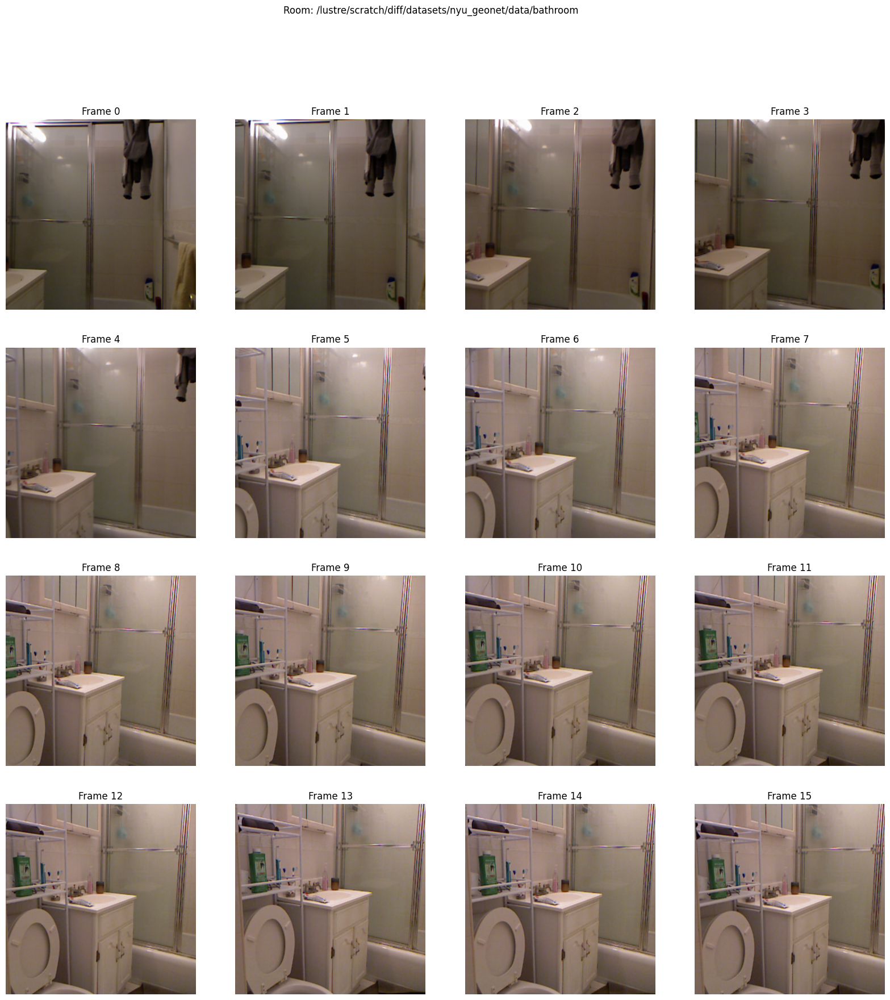

In [71]:
# plot the images
import matplotlib.pyplot as plt
import numpy as np


def plot_images(images, depth, snorm, room):
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    for i in range(16):
        axs[i // 4, i % 4].imshow(images[i].permute(1, 2, 0).numpy())
        axs[i // 4, i % 4].set_title(f"Frame {i}")
        axs[i // 4, i % 4].axis("off")
    plt.suptitle(f"Room: {room}")
    plt.show()


plot_images(x["image"], x["depth"], x["snorm"], x["room"])

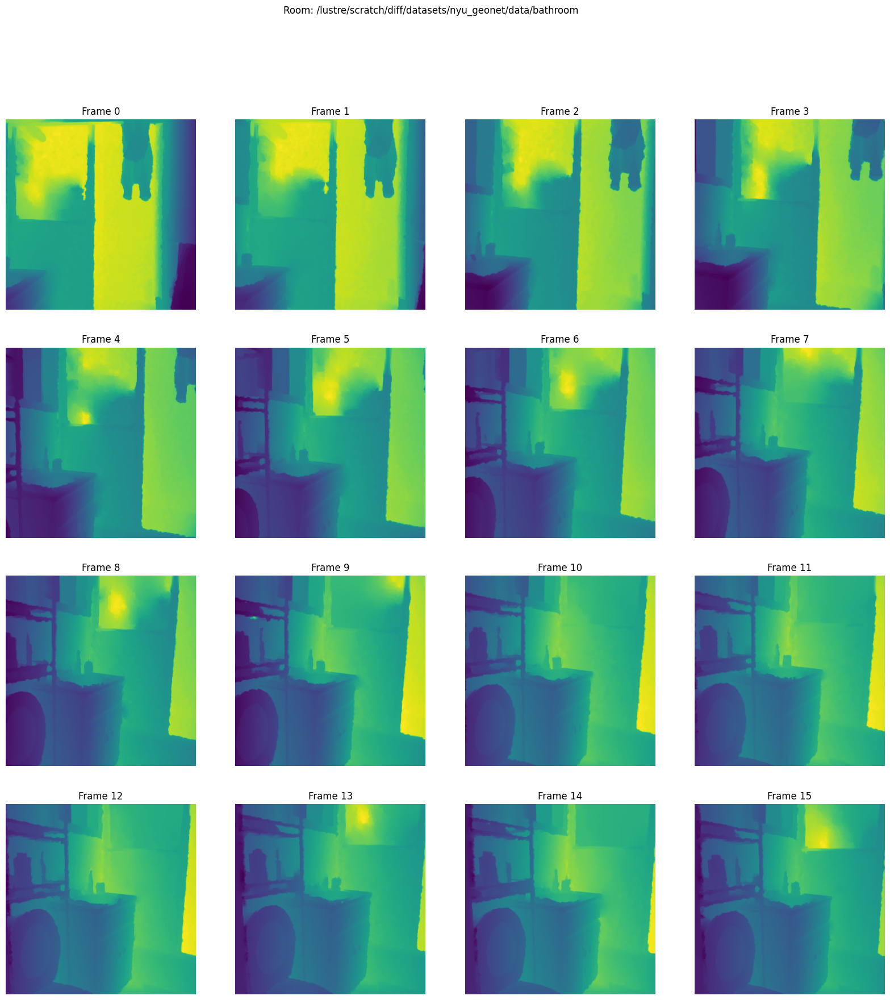

In [72]:
# plot depths 
def plot_depths(depths, room):
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    for i in range(16):
        axs[i // 4, i % 4].imshow(depths[i][0].numpy())
        axs[i // 4, i % 4].set_title(f"Frame {i}")
        axs[i // 4, i % 4].axis("off")
    plt.suptitle(f"Room: {room}")
    plt.show()


plot_depths(x["depth"], x["room"])

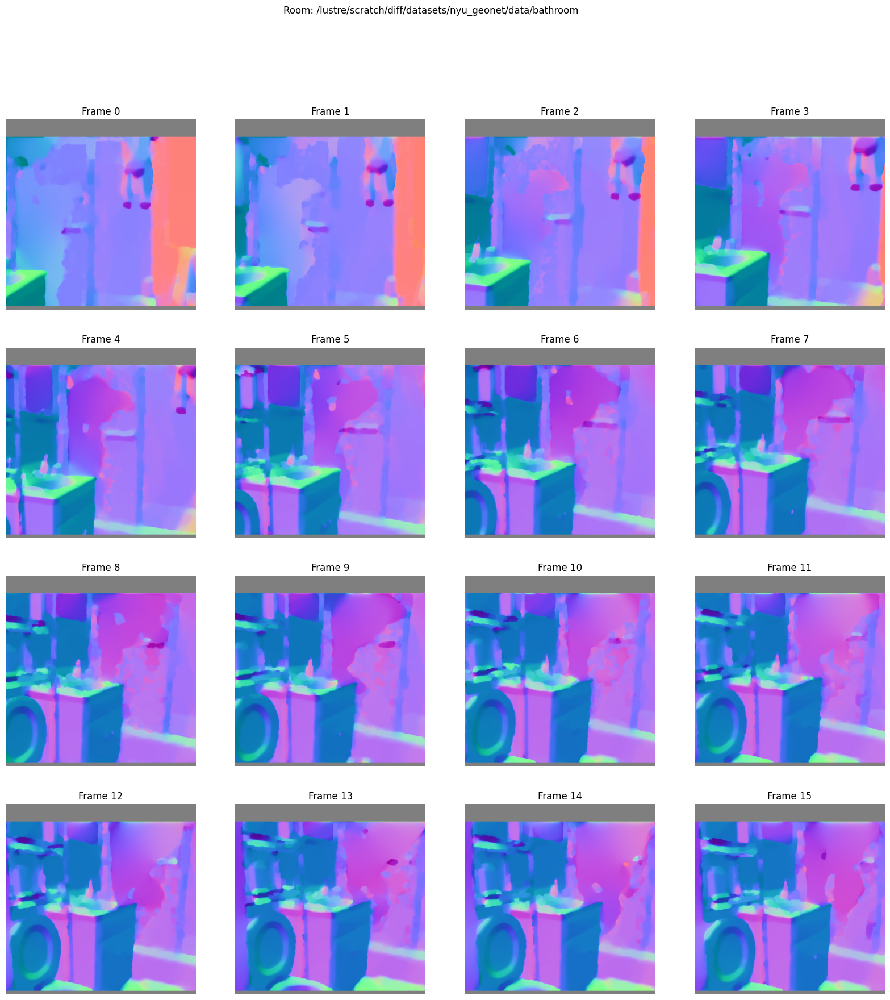

In [102]:
# visualize the surface normals
def plot_snorms(snorms, room):
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    for i in range(16):
        snorm = snorms[i].permute(1, 2, 0).numpy()
        snorm = (snorm + 1) / 2
        axs[i // 4, i % 4].imshow(snorm)
        axs[i // 4, i % 4].set_title(f"Frame {i}")
        axs[i // 4, i % 4].axis("off")
    plt.suptitle(f"Room: {room}")
    plt.show()
 

plot_snorms(x["snorm"], x["room"])

In [54]:
# create dataloader 
from torch.utils.data import DataLoader
dataloader = DataLoader(data_video, batch_size=8, shuffle=True) 


In [57]:
# test dataloader
for i, data in enumerate(dataloader):
    print(len(data))
    # print(i, data["image"].shape, data["depth"].shape, data["snorm"].shape)
    break

16


In [61]:
# test dataloader
for i, data in enumerate(dataloader):
    print(len(data))
    # print(i, data["image"].shape, data["depth"].shape, data["snorm"].shape)
    break

16


## Load data NYUv2 test set

In [ ]:
class NYU_test_old(torch.utils.data.Dataset):
    """
    Dataset loader based on Ishan Misra's SSL benchmark
    """

    def __init__(self, path, image_mean="imagenet", center_crop=False):
        super().__init__()
        self.name = "NYUv2"
        self.center_crop = center_crop
        self.max_depth = 10.0

        # get transforms
        image_size = (480, 480) if center_crop else (480, 640)
        self.image_transform, self.shared_transform = get_nyu_transforms(
            image_mean,
            image_size,
            False,
            rotateflip=False,
            additional_targets={"depth": "image", "snorm": "image"},
        )

        # parse data
        with open(path, "rb") as f:
            data_dict = pickle.load(f)

        self.indices = data_dict["test_indices"]
        self.depths = [data_dict["depths"][_i] for _i in self.indices]
        self.images = [data_dict["images"][_i] for _i in self.indices]
        self.scenes = [data_dict["scene_types"][_i][0] for _i in self.indices]
        self.snorms = [data_dict["snorms"][_i] for _i in self.indices]

        num_instances = len(self.indices)
        print(f"NYUv2 labeled test set: {num_instances} instances")

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, index):
        image = self.images[index]
        depth = self.depths[index]
        snorm = self.snorms[index]
        room = self.scenes[index]
        nyu_index = self.indices[index]

        # transform image
        image = np.transpose(image, (1, 2, 0))
        image = self.image_transform(image)

        # set max depth to 10
        depth[depth > 10] = 0

        # center crop
        if self.center_crop:
            image = image[..., 80:-80]
            depth = depth[..., 80:-80]
            snorm = snorm[..., 80:-80]

        # move to tensor
        depth = torch.tensor(depth).float()[None, :, :]
        snorm = torch.tensor(snorm).float()

        return {
            "image": image,
            "depth": depth,
            "snorm": snorm,
            "room": room,
            "nyu_index": nyu_index,
        }

In [104]:
import mat73

In [105]:
nyuv2_dict = mat73.loadmat("/lustre/scratch/diff/datasets/nyuv2/nyu_depth_v2_labeled.mat")

ERROR:root:ERROR: MATLAB type not supported: containers.Map, (uint32)


In [106]:
nyuv2_dict.keys()

dict_keys(['accelData', 'depths', 'images', 'instances', 'labels', 'names', 'namesToIds', 'rawDepthFilenames', 'rawDepths', 'rawRgbFilenames', 'sceneTypes', 'scenes'])

In [119]:
sorted(nyuv2_dict["rawRgbFilenames"])

[['basement_0001a/r-1316653580.774394-1334503209.ppm'],
 ['basement_0001a/r-1316653591.579597-1982596359.ppm'],
 ['basement_0001a/r-1316653613.813694-3316788121.ppm'],
 ['basement_0001a/r-1316653624.884491-3980883571.ppm'],
 ['basement_0001a/r-1316653629.089885-4232919796.ppm'],
 ['basement_0001b/r-1316653649.248179-1148126438.ppm'],
 ['basement_0001b/r-1316653659.548292-1766215275.ppm'],
 ['bathroom_0001/r-1294886889.051208-365592038.ppm'],
 ['bathroom_0002/r-1295148733.248304-3836198014.ppm'],
 ['bathroom_0002/r-1295148736.261033-4016223889.ppm'],
 ['bathroom_0003/r-1295406974.176729-3401446534.ppm'],
 ['bathroom_0004/r-1295836681.712073-1755069346.ppm'],
 ['bathroom_0005/r-1295837594.698575-3478376057.ppm'],
 ['bathroom_0006/r-1295839279.324567-1475688615.ppm'],
 ['bathroom_0007/r-1299814498.965823-2514652658.ppm'],
 ['bathroom_0007/r-1299814511.509091-3266760758.ppm'],
 ['bathroom_0008/r-1300200406.257365-3105838053.ppm'],
 ['bathroom_0009/r-1300302685.118673-2801807861.ppm'],
 ['b

In [140]:
len([x for x in sorted(nyuv2_dict["rawRgbFilenames"]) if "kitchen_0010" in x[0]])

4

In [116]:
nyuv2_dict["depths"].shape

(480, 640, 1449)

## Load NAVI Dataset

In [5]:
import glob
import json
import os
from pathlib import Path

import numpy as np
import torch

from evals.datasets.utils  import (
    bbox_crop,
    camera_matrices_from_annotation,
    compute_normal,
    get_grid,
    get_navi_transforms,
    read_depth,
    read_image,
)

navi_dataset_path = "/lustre/scratch/diff/datasets/navi_v1"

In [7]:
class NAVI(torch.utils.data.Dataset):
    def __init__(
        self,
        path,
        split="train",
        model="all",
        image_mean="imagenet",
        augment_train=False,
        rotateflip=False,
        bbox_crop=True,
        pair_dataset=False,
        max_angle=120,
        relative_depth=False,
    ):
        super().__init__()

        # generate splits based on collections and subparts
        if split == "train":
            collection = "multiview"
            subpart = "train"
        elif split == "valid":
            collection = "multiview"
            subpart = "test"
        elif split == "trainval":
            collection = "multiview"
            subpart = "all"
        elif split == "test":
            collection = "wild"
            subpart = "all"
        else:
            raise ValueError(f"Unknown split: {split}")

        # set path
        self.data_root = Path(path)
        self.bbox_crop = bbox_crop
        self.relative_depth = relative_depth
        self.max_depth = 1.0

        self.name = f"NAVI_{collection}_{subpart}"
        if relative_depth:
            self.name = self.name + "_reldepth"

        # parse dataset
        self.data_dict = self.parse_dataset()
        self.define_instances_split(model, collection, subpart)

        # get transforms
        augment = augment_train and "train" in split
        image_size = (512, 512)
        t_fns = get_navi_transforms(
            image_mean,
            image_size=image_size,
            augment=augment,
            rotateflip=rotateflip,
            additional_targets={
                "depth": "image",
                "snorm": "image",
                "xyz_grid": "image",
            },
        )
        self.image_transform, self.target_transform, self.shared_transform = t_fns
        print(f"NAVI {collection} {subpart} {model}: {len(self.instances)} instances")

        self.pair_dataset = pair_dataset
        self.max_angle = max_angle
        if self.pair_dataset:
            self.pair_indices = self.generate_instance_pairs(self.instances)

        self.instances = self.instances[::4]

    def __len__(self):
        return len(self.instances)

    def __getitem__(self, index):
        if self.pair_dataset:
            obj_id, scene_id, img_id_0 = self.instances[index]
            img_id_1 = self.pair_indices[obj_id][scene_id][img_id_0]

            inst_0 = self.get_single(obj_id, scene_id, img_id_0)
            inst_1 = self.get_single(obj_id, scene_id, img_id_1)

            output = {}
            for key in inst_0:
                output[f"{key}_0"] = inst_0[key]
                output[f"{key}_1"] = inst_1[key]

            # computer relative pose
            Rt_01 = output["Rt_1"] @ output["Rt_0"].inverse()
            output["Rt_01"] = Rt_01
            output["pair_id"] = f"{img_id_0}-{img_id_1}"
        else:
            obj_id, scene_id, img_id = self.instances[index]
            output = self.get_single(obj_id, scene_id, img_id)

        return output

    def get_single(self, obj_id, scene_id, img_id):
        obj_number = self.objects[obj_id]
        anno = self.data_dict[obj_id][scene_id]["annotations"][img_id]

        # get scene path
        prefix = "downsampled_"
        scene_path = self.data_root / obj_id / scene_id
        image_path = scene_path / f"images/{prefix}{img_id}.jpg"
        depth_path = scene_path / f"depth/{prefix}{img_id}.png"

        # get image
        image = read_image(image_path)
        image = self.image_transform(image)

        # get depth -- move from millimeter to meters
        depth = read_depth(str(depth_path)) / 1000
        min_depth = depth[depth > 0].min()
        depth = self.target_transform(depth)

        #  === construct xyz at full image size and apply all transformations ===
        orig_h, orig_w = anno["image_size"]
        image_h, image_w = image.shape[1:]
        orig_fx = anno["camera"]["focal_length"]
        aug_fx = orig_fx * min(image_h, image_w) / min(orig_h, orig_w)

        # intrnsics for augmented image
        intrinsics = torch.eye(3)
        intrinsics[0, 0] = aug_fx
        intrinsics[1, 1] = aug_fx
        intrinsics[0, 2] = 0.5 * image_h  # assume offset is at the center
        intrinsics[1, 2] = 0.5 * image_w  # assume offset is at the center

        # make grid
        grid = get_grid(image_h, image_w)
        uvd_grid = depth * grid
        xyz = intrinsics.inverse() @ uvd_grid.view(3, image_h * image_w)
        xyz_grid = xyz.view(3, image_h, image_w)

        if self.bbox_crop:
            image, depth, xyz_grid = bbox_crop(image, depth, xyz_grid)

        bbox_h, bbox_w = image.shape[1:]
        snorm = compute_normal(depth.clone(), aug_fx)

        if self.shared_transform is not None:
            transformed = self.shared_transform(
                image=image.permute(1, 2, 0).numpy(),
                depth=depth.permute(1, 2, 0).numpy(),
                snorm=snorm.permute(1, 2, 0).numpy(),
                xyz_grid=xyz_grid.permute(1, 2, 0).numpy(),
            )

            image = torch.tensor(transformed["image"]).float().permute(2, 0, 1)
            depth = torch.tensor(transformed["depth"]).float()[None, :, :, 0]
            snorm = torch.tensor(transformed["snorm"]).float().permute(2, 0, 1)
            xyz_grid = torch.tensor(transformed["xyz_grid"]).float().permute(2, 0, 1)

        # -- use min() to handle center cropping
        final_h, final_w = image.shape[1:]
        final_fx = aug_fx * min(final_h, final_w) / min(bbox_h, bbox_w)
        intrinsics = torch.eye(3)
        intrinsics[:2] = final_fx * intrinsics[:2]

        # remove weird depth artifacts from averaging
        depth[depth < min_depth] = 0

        # extract pose and change translation unit from mm to meters
        Rt = camera_matrices_from_annotation(anno)
        Rt[:3, 3] = Rt[:3, 3] / 1000.0

        if self.relative_depth:
            max_depth = depth.max()
            zero_mask = depth == 0

            # normalize depth between 0 and 1
            depth = (depth - min_depth) / max(0.01, max_depth - min_depth)
            depth = depth * 0.99 + 0.01

            # set zero deoth to zero
            depth[zero_mask] = 0

        # mask = (depth > 0).float()
        # image = (image * mask) + torch.ones_like(image) * (1 - mask)

        return {
            "image": image,
            "depth": depth,
            "class_id": obj_number,
            "intrinsics": intrinsics,
            "snorm": snorm,
            "Rt": Rt,
            "anno": anno,
            "xyz_grid": xyz_grid,
        }

    def parse_dataset(self):
        """
        Parses the directory for instances.
        Input: data_dict -- sturcture  <object_id>/<collection>/<instances>

        Output: all dataset instances
        """
        data_dict = {}

        # get all image folders
        all_collections = []
        all_collections += glob.glob(str(self.data_root / "*/multiview_*"))
        all_collections += glob.glob(str(self.data_root / "*/wild_set"))

        # parse image folders
        for collection_path in all_collections:
            object_id, collection_id = collection_path.split("/")[-2:]

            # get image ids
            img_files = os.listdir(os.path.join(collection_path, "images"))
            img_ids = [_file.split(".")[0] for _file in img_files if "jpg" in _file]

            # VERY hacky | remove small_
            img_ids = [_id for _id in img_ids if "_" not in _id]

            # load annotations and convert them to a dictionary
            with open(os.path.join(collection_path, "annotations.json")) as f:
                annotations = json.load(f)
                annotations = {
                    _an["filename"].split(".")[0]: _an for _an in annotations
                }

            # update data_dict
            if object_id not in data_dict:
                data_dict[object_id] = {}

            data_dict[object_id][collection_id] = {
                "views": img_ids,
                "annotations": annotations,
            }

        return data_dict

    def define_instances_split(self, model, collection, subpart):
        # get a list of object names
        if model == "all":
            object_names = list(self.data_dict.keys())
        else:
            object_names = [model]

        assert collection in ["multiview", "wild"]
        assert subpart in ["train", "test", "all"]

        self.instances = []
        self.objects = []

        for obj_id in object_names:
            scenes = list(self.data_dict[obj_id].keys())
            if "wild_set" not in scenes or len(scenes) == 1:
                print(f"Skipping object {obj_id}.")
                continue
            else:
                self.objects.append(obj_id)

            if collection == "wild":
                image_ids = self.data_dict[obj_id]["wild_set"]["views"]
                image_ann = self.data_dict[obj_id]["wild_set"]["annotations"]
                assert len(image_ids) > 1

                for _id in image_ids:
                    if subpart == "all":
                        self.instances.append((obj_id, "wild_set", _id))
                    else:
                        im_split = image_ann[_id]["split"]
                        if subpart == "train" and im_split == "train":
                            self.instances.append((obj_id, "wild_set", _id))
                        elif subpart == "test" and im_split == "val":
                            self.instances.append((obj_id, "wild_set", _id))
            else:
                scenes = [_s for _s in scenes if "multiview" in _s]

                # int floors -> at least 1 validation scene
                train_split = int(0.9 * len(scenes))

                if subpart == "train":
                    scenes = scenes[:train_split]
                elif subpart == "test":
                    scenes = scenes[train_split:]
                elif subpart == "all":
                    scenes = scenes
                else:
                    assert collection == "multiview", f"collection was {collection}."

                if len(scenes) == 0:
                    continue

                for scene in scenes:
                    image_ids = self.data_dict[obj_id][scene]["views"]
                    for _id in image_ids:
                        self.instances.append((obj_id, scene, _id))

        # create object -> class mapping
        self.objects.sort()
        self.objects = {_obj: _id for _id, _obj in enumerate(self.objects)}

    def generate_instance_pairs(self, instances):
        torch.manual_seed(8)
        inst_dict = {}
        for ins in instances:
            obj_id, coll_id, img_id = ins
            if obj_id not in inst_dict:
                inst_dict[obj_id] = {coll_id: [img_id]}
            elif coll_id not in inst_dict[obj_id]:
                inst_dict[obj_id][coll_id] = [img_id]
            else:
                inst_dict[obj_id][coll_id].append(img_id)

        pair_dict = {}
        for obj_id in inst_dict:
            pair_dict[obj_id] = {}
            for col_id in inst_dict[obj_id]:
                pair_dict[obj_id][col_id] = {}
                rots = []
                img_ids = []
                for img_id in inst_dict[obj_id][col_id]:
                    anno = self.data_dict[obj_id][col_id]["annotations"][img_id]
                    Rt = camera_matrices_from_annotation(anno)
                    rots.append(Rt[:3, :3])
                    img_ids.append(img_id)
                rots = torch.stack(rots, dim=0)

                # for each image find a pair between 0 and max_angle degrees
                for i in range(len(img_ids)):
                    img_id = img_ids[i]
                    rots_i = rots[i, None].repeat(len(rots), 1, 1)
                    rots_ij = torch.bmm(rots_i, rots.permute(0, 2, 1))
                    rots_tr = rots_ij[:, 0, 0] + rots_ij[:, 1, 1] + rots_ij[:, 2, 2]
                    rel_ang_rad = (0.5 * rots_tr - 0.5).clamp(min=-1, max=1).acos()
                    rel_ang_deg = rel_ang_rad * 180 / np.pi

                    # only sample from deg(0, max_angle)
                    rel_ang_deg[rel_ang_deg > self.max_angle] = 0
                    rel_ang_deg[rel_ang_deg > 0] = 1

                    # sample an element
                    pair_i = torch.multinomial(rel_ang_deg, 1).item()
                    pair_dict[obj_id][col_id][img_id] = img_ids[pair_i]

        return pair_dict


In [59]:
class NAVI_video(torch.utils.data.Dataset):
    def __init__(
        self,
        path,
        split="train",
        model="all",
        image_mean="imagenet",
        augment_train=False,
        rotateflip=False,
        bbox_crop=True,
        pair_dataset=False,
        max_angle=120,
        relative_depth=False,
    ):
        super().__init__()

        # generate splits based on collections and subparts
        if split == "train":
            collection = "multiview"
            subpart = "train"
        elif split == "valid":
            collection = "multiview"
            subpart = "test"
        elif split == "trainval":
            collection = "multiview"
            subpart = "all"
        elif split == "test":
            collection = "wild"
            subpart = "all"
        else:
            raise ValueError(f"Unknown split: {split}")

        # set path
        self.data_root = Path(path)
        self.bbox_crop = bbox_crop
        self.relative_depth = relative_depth
        self.max_depth = 1.0

        self.name = f"NAVI_{collection}_{subpart}"
        if relative_depth:
            self.name = self.name + "_reldepth"

        # parse dataset
        self.data_dict = self.parse_dataset()
        self.define_instances_split(model, collection, subpart)

        # get transforms
        augment = augment_train and "train" in split
        image_size = (512, 512)
        t_fns = get_navi_transforms(
            image_mean,
            image_size=image_size,
            augment=augment,
            rotateflip=rotateflip,
            additional_targets={
                "depth": "image",
                "snorm": "image",
                "xyz_grid": "image",
            },
        )
        self.image_transform, self.target_transform, self.shared_transform = t_fns
        print(f"NAVI {collection} {subpart} {model}: {len(self.instances)} instances")

        self.pair_dataset = pair_dataset
        self.max_angle = max_angle
        if self.pair_dataset:
            self.pair_indices = self.generate_instance_pairs(self.instances)

        self.instances = self.instances[::4]

    def __len__(self):
        return len(self.instances)

    def __getitem__(self, index):
        if self.pair_dataset:
            obj_id, scene_id, img_id_0 = self.instances[index]
            img_id_1 = self.pair_indices[obj_id][scene_id][img_id_0]

            inst_0 = self.get_single(obj_id, scene_id, img_id_0)
            inst_1 = self.get_single(obj_id, scene_id, img_id_1)

            output = {}
            for key in inst_0:
                output[f"{key}_0"] = inst_0[key]
                output[f"{key}_1"] = inst_1[key]

            # computer relative pose
            Rt_01 = output["Rt_1"] @ output["Rt_0"].inverse()
            output["Rt_01"] = Rt_01
            output["pair_id"] = f"{img_id_0}-{img_id_1}"
        else:
            scene_ann = self.instances[index]
            output = self.get_video(scene_ann, frames = 16)

        return output
    def get_video(self, scene_ann, frames = 16):
        obj_id, scene_id = scene_ann
        img_ids = self.data_dict[obj_id][scene_id]["views"]
        print("len img_ids", len(img_ids))
        # choose random starting point
        start = np.random.randint(0, len(img_ids) - frames)
        img_ids = img_ids[start:start + frames]

        # get all frames
        frames = []
        for img_id in img_ids:
            inst = self.get_single(obj_id, scene_id, img_id)
            frames.append(inst)
        # stack frames
        output = {}
        output["class_id"] = [_inst["class_id"] for _inst in frames]
        output["anno"]  =  [_inst["anno"] for _inst in frames]
        for key in frames[0]:
            if key == 'class_id' or key == 'anno':
                continue
            output[key] = torch.stack([_inst[key] for _inst in frames], dim=0)

        return output
    def get_single(self, obj_id, scene_id, img_id):
        obj_number = self.objects[obj_id]
        anno = self.data_dict[obj_id][scene_id]["annotations"][img_id]

        # get scene path
        prefix = "downsampled_"
        scene_path = self.data_root / obj_id / scene_id
        image_path = scene_path / f"images/{prefix}{img_id}.jpg"
        depth_path = scene_path / f"depth/{prefix}{img_id}.png"

        # get image
        image = read_image(image_path)
        image = self.image_transform(image)

        # get depth -- move from millimeter to meters
        depth = read_depth(str(depth_path)) / 1000
        min_depth = depth[depth > 0].min()
        depth = self.target_transform(depth)

        #  === construct xyz at full image size and apply all transformations ===
        orig_h, orig_w = anno["image_size"]
        image_h, image_w = image.shape[1:]
        orig_fx = anno["camera"]["focal_length"]
        aug_fx = orig_fx * min(image_h, image_w) / min(orig_h, orig_w)

        # intrnsics for augmented image
        intrinsics = torch.eye(3)
        intrinsics[0, 0] = aug_fx
        intrinsics[1, 1] = aug_fx
        intrinsics[0, 2] = 0.5 * image_h  # assume offset is at the center
        intrinsics[1, 2] = 0.5 * image_w  # assume offset is at the center

        # make grid
        grid = get_grid(image_h, image_w)
        uvd_grid = depth * grid
        xyz = intrinsics.inverse() @ uvd_grid.view(3, image_h * image_w)
        xyz_grid = xyz.view(3, image_h, image_w)

        if self.bbox_crop:
            image, depth, xyz_grid = bbox_crop(image, depth, xyz_grid)

        bbox_h, bbox_w = image.shape[1:]
        snorm = compute_normal(depth.clone(), aug_fx)

        if self.shared_transform is not None:
            transformed = self.shared_transform(
                image=image.permute(1, 2, 0).numpy(),
                depth=depth.permute(1, 2, 0).numpy(),
                snorm=snorm.permute(1, 2, 0).numpy(),
                xyz_grid=xyz_grid.permute(1, 2, 0).numpy(),
            )

            image = torch.tensor(transformed["image"]).float().permute(2, 0, 1)
            depth = torch.tensor(transformed["depth"]).float()[None, :, :, 0]
            snorm = torch.tensor(transformed["snorm"]).float().permute(2, 0, 1)
            xyz_grid = torch.tensor(transformed["xyz_grid"]).float().permute(2, 0, 1)

        # -- use min() to handle center cropping
        final_h, final_w = image.shape[1:]
        final_fx = aug_fx * min(final_h, final_w) / min(bbox_h, bbox_w)
        intrinsics = torch.eye(3)
        intrinsics[:2] = final_fx * intrinsics[:2]

        # remove weird depth artifacts from averaging
        depth[depth < min_depth] = 0

        # extract pose and change translation unit from mm to meters
        Rt = camera_matrices_from_annotation(anno)
        Rt[:3, 3] = Rt[:3, 3] / 1000.0

        if self.relative_depth:
            max_depth = depth.max()
            zero_mask = depth == 0

            # normalize depth between 0 and 1
            depth = (depth - min_depth) / max(0.01, max_depth - min_depth)
            depth = depth * 0.99 + 0.01

            # set zero deoth to zero
            depth[zero_mask] = 0

        # mask = (depth > 0).float()
        # image = (image * mask) + torch.ones_like(image) * (1 - mask)

        return {
            "image": image,
            "depth": depth,
            "class_id": obj_number,
            "intrinsics": intrinsics,
            "snorm": snorm,
            "Rt": Rt,
            "anno": anno,
            "xyz_grid": xyz_grid,
        }

    def parse_dataset(self):
        """
        Parses the directory for instances.
        Input: data_dict -- sturcture  <object_id>/<collection>/<instances>

        Output: all dataset instances
        """
        data_dict = {}

        # get all image folders
        all_collections = []
        all_collections += glob.glob(str(self.data_root / "*/multiview_*"))
        all_collections += glob.glob(str(self.data_root / "*/wild_set"))

        # parse image folders
        for collection_path in all_collections:
            object_id, collection_id = collection_path.split("/")[-2:]

            # get image ids
            img_files = os.listdir(os.path.join(collection_path, "images"))
            img_ids = [_file.split(".")[0] for _file in img_files if "jpg" in _file]

            # VERY hacky | remove small_
            img_ids = [_id for _id in img_ids if "_" not in _id]

            # load annotations and convert them to a dictionary
            with open(os.path.join(collection_path, "annotations.json")) as f:
                annotations = json.load(f)
                annotations = {
                    _an["filename"].split(".")[0]: _an for _an in annotations
                }

            # update data_dict
            if object_id not in data_dict:
                data_dict[object_id] = {}

            data_dict[object_id][collection_id] = {
                "views": img_ids,
                "annotations": annotations,
            }

        return data_dict

    def define_instances_split(self, model, collection, subpart):
        # get a list of object names
        if model == "all":
            object_names = list(self.data_dict.keys())
        else:
            object_names = [model]

        assert collection in ["multiview", "wild"]
        assert subpart in ["train", "test", "all"]

        self.instances = []
        self.objects = []

        for obj_id in object_names:
            scenes = list(self.data_dict[obj_id].keys())
            if "wild_set" not in scenes or len(scenes) == 1:
                print(f"Skipping object {obj_id}.")
                continue
            else:
                self.objects.append(obj_id)

            if collection == "wild":
                image_ids = self.data_dict[obj_id]["wild_set"]["views"]
                image_ann = self.data_dict[obj_id]["wild_set"]["annotations"]
                assert len(image_ids) > 1

                for _id in image_ids:
                    if subpart == "all":
                        self.instances.append((obj_id, "wild_set", _id))
                    else:
                        im_split = image_ann[_id]["split"]
                        if subpart == "train" and im_split == "train":
                            self.instances.append((obj_id, "wild_set", _id))
                        elif subpart == "test" and im_split == "val":
                            self.instances.append((obj_id, "wild_set", _id))
            else:
                scenes = [_s for _s in scenes if "multiview" in _s]

                # int floors -> at least 1 validation scene
                train_split = int(0.9 * len(scenes))

                if subpart == "train":
                    scenes = scenes[:train_split]
                elif subpart == "test":
                    scenes = scenes[train_split:]
                elif subpart == "all":
                    scenes = scenes
                else:
                    assert collection == "multiview", f"collection was {collection}."

                if len(scenes) == 0:
                    continue

                for scene in scenes:
                    if len(self.data_dict[obj_id][scene]["views"]) >= 16:
                        self.instances.append((obj_id, scene))

        # create object -> class mapping
        self.objects.sort()
        self.objects = {_obj: _id for _id, _obj in enumerate(self.objects)}

    def generate_instance_pairs(self, instances):
        torch.manual_seed(8)
        inst_dict = {}
        for ins in instances:
            obj_id, coll_id, img_id = ins
            if obj_id not in inst_dict:
                inst_dict[obj_id] = {coll_id: [img_id]}
            elif coll_id not in inst_dict[obj_id]:
                inst_dict[obj_id][coll_id] = [img_id]
            else:
                inst_dict[obj_id][coll_id].append(img_id)

        pair_dict = {}
        for obj_id in inst_dict:
            pair_dict[obj_id] = {}
            for col_id in inst_dict[obj_id]:
                pair_dict[obj_id][col_id] = {}
                rots = []
                img_ids = []
                for img_id in inst_dict[obj_id][col_id]:
                    anno = self.data_dict[obj_id][col_id]["annotations"][img_id]
                    Rt = camera_matrices_from_annotation(anno)
                    rots.append(Rt[:3, :3])
                    img_ids.append(img_id)
                rots = torch.stack(rots, dim=0)

                # for each image find a pair between 0 and max_angle degrees
                for i in range(len(img_ids)):
                    img_id = img_ids[i]
                    rots_i = rots[i, None].repeat(len(rots), 1, 1)
                    rots_ij = torch.bmm(rots_i, rots.permute(0, 2, 1))
                    rots_tr = rots_ij[:, 0, 0] + rots_ij[:, 1, 1] + rots_ij[:, 2, 2]
                    rel_ang_rad = (0.5 * rots_tr - 0.5).clamp(min=-1, max=1).acos()
                    rel_ang_deg = rel_ang_rad * 180 / np.pi

                    # only sample from deg(0, max_angle)
                    rel_ang_deg[rel_ang_deg > self.max_angle] = 0
                    rel_ang_deg[rel_ang_deg > 0] = 1

                    # sample an element
                    pair_i = torch.multinomial(rel_ang_deg, 1).item()
                    pair_dict[obj_id][col_id][img_id] = img_ids[pair_i]

        return pair_dict


In [60]:
# navi_reldepth = NAVI(navi_dataset_path, "train", model="all", image_mean="None", augment_train=False, bbox_crop=True, relative_depth=True)
navi_video = NAVI_video(navi_dataset_path, "train", model="all", image_mean="None", augment_train=False, bbox_crop=True, relative_depth=True)

Skipping object bottle_vitamin_d_tablets.
Skipping object shoe_right_gray_s.
NAVI multiview train all: 195 instances


In [61]:
from torch.utils.data import DataLoader
# create data loader
dataloader = DataLoader(navi_video, batch_size=1, shuffle=False)

# get a batch of data
x = next(iter(dataloader))

len img_ids 35


In [62]:
x["image"].shape

torch.Size([1, 16, 3, 512, 512])

In [14]:
x.keys()

dict_keys(['image', 'depth', 'class_id', 'intrinsics', 'snorm', 'Rt', 'anno', 'xyz_grid'])

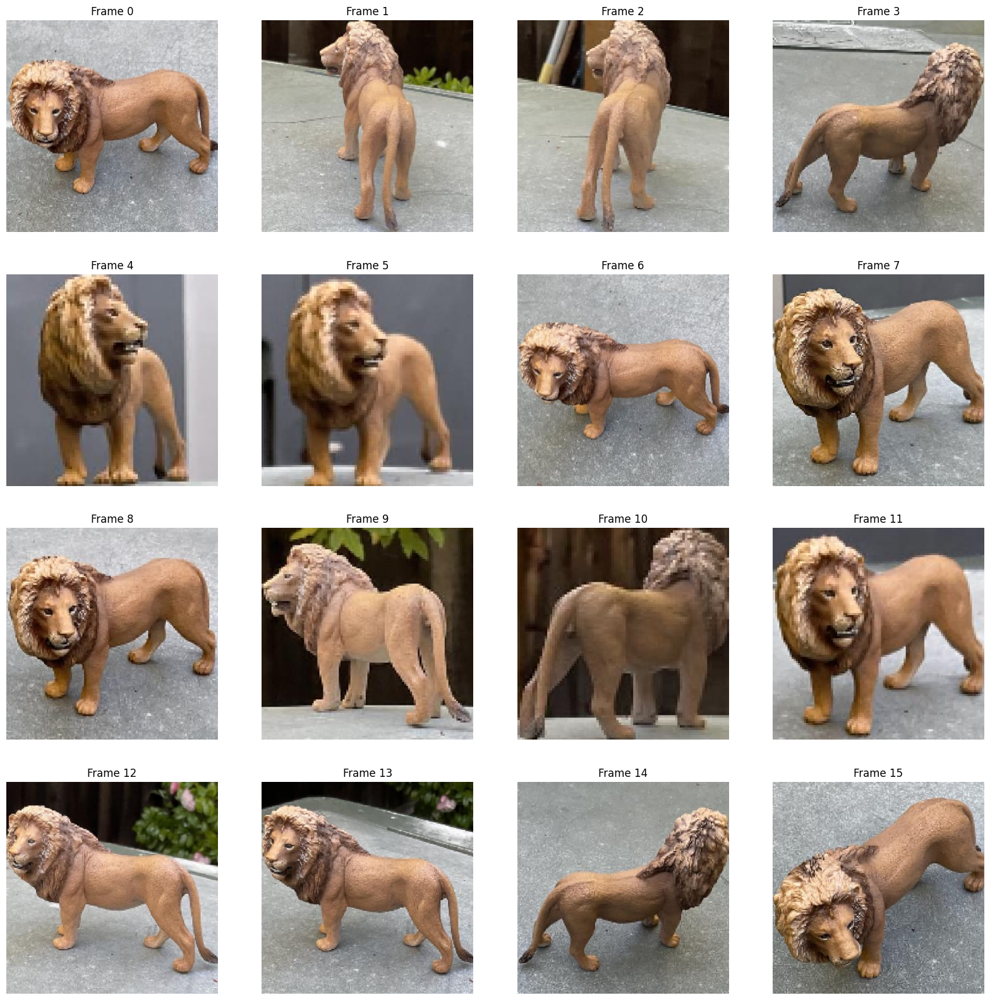

In [63]:
# plot the images
import matplotlib.pyplot as plt
import numpy as np


def plot_images(images, depth, snorm):
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    for i in range(16):
        axs[i // 4, i % 4].imshow(images[i].permute(1, 2, 0).numpy())
        axs[i // 4, i % 4].set_title(f"Frame {i}")
        axs[i // 4, i % 4].axis("off")
    plt.show()


plot_images(x["image"].squeeze(), x["depth"].squeeze, x["snorm"].squeeze())

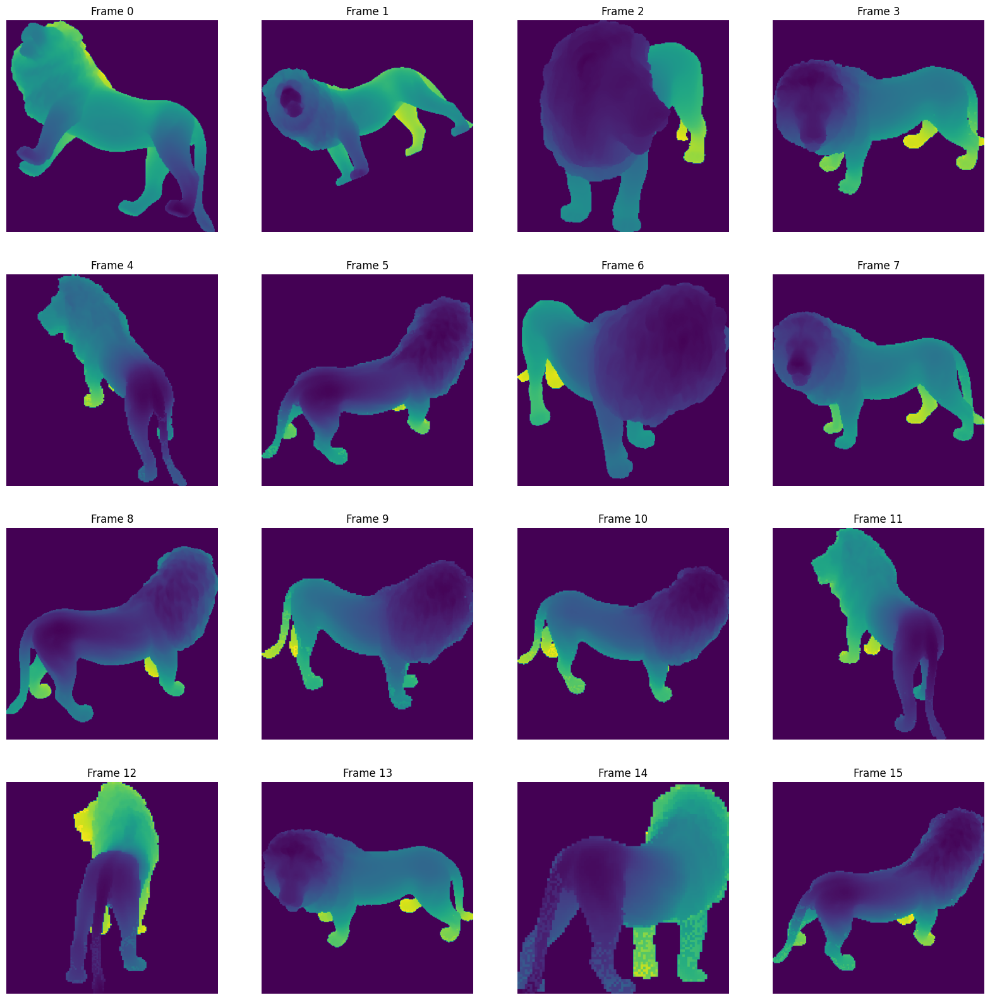

In [25]:
# plot depths 
def plot_depths(depths):
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    for i in range(16):
        axs[i // 4, i % 4].imshow(depths[i][0].numpy())
        axs[i // 4, i % 4].set_title(f"Frame {i}")
        axs[i // 4, i % 4].axis("off")
    plt.show()


plot_depths(x["depth"])